# Setup

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


# Feature engineering

In [45]:
df = pd.read_csv('aggregated_data_250ms.csv')

In [18]:
overlap_percentage = 0.9

In [46]:
df

,End Time,Run,Participant,Path,count_Acceleration x (m/s^2)_head,count_Acceleration x (m/s^2)_leg,count_Acceleration y (m/s^2)_head,count_Acceleration y (m/s^2)_leg,count_Acceleration z (m/s^2)_head,count_Acceleration z (m/s^2)_leg,...,min_Distance (cm)_head,min_Distance (cm)_leg,min_Illuminance (lx)_head,std_Distance (cm)_leg,std_Illuminance (lx)_head,std_Height (m)_leg,std_Horizontal Accuracy (m)_leg,std_Latitude (°)_leg,std_Longitude (°)_leg,std_Vertical Accuracy (°)_leg
0,1970-01-01 00:01:14.236228590,3,Julian,circle,113.0,0.0,113.0,0.0,113.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1970-01-01 00:01:14.486228590,3,Julian,circle,118.0,0.0,118.0,0.0,118.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1970-01-01 00:01:14.736228590,3,Julian,circle,117.0,0.0,117.0,0.0,117.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1970-01-01 00:01:14.986228590,3,Julian,circle,118.0,0.0,118.0,0.0,118.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1970-01-01 00:01:15.236228590,3,Julian,circle,117.0,0.0,117.0,0.0,117.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14565,1970-01-01 00:04:19.202577700,3,Martin,straight,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14566,1970-01-01 00:04:19.452577700,3,Martin,straight,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14567,1970-01-01 00:04:19.702577700,3,Martin,straight,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14568,1970-01-01 00:04:19.952577700,3,Martin,straight,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [47]:
print(df.groupby('Participant').size())

Participant
Dany       2597
Felix      2263
Julian     1894
Mark       1888
Martin     1884
Michele    1837
Paul       2207
dtype: int64


## Time domain

In [212]:
# performing feature engineering on the data

window_size = 80

# calculating the number of windows

num_windows = int(df.shape[0] / (window_size * (1 - overlap_percentage)))

print('Number of windows:', num_windows)

# print number of windows for each participant
print(df.groupby('Participant').size() / (window_size * (1 - overlap_percentage)))

Number of windows: 1821
Participant
Dany       324.625
Felix      282.875
Julian     236.750
Mark       236.000
Martin     235.500
Michele    229.625
Paul       275.875
dtype: float64


In [49]:
# compute duration in seconds of each window

# interval size in seconds of each row in the dataset
interval_size = 0.25 # seconds

duration = window_size * interval_size

print('Duration of each window:', duration, 'seconds')


Duration of each window: 20.0 seconds


In [104]:
# drop the columns that start with count or std

cols = df.columns

cols_to_drop = []

for col in cols:
    if col.startswith('count') or col.startswith('std'):
        cols_to_drop.append(col)

slim_df = df.drop(cols_to_drop, axis=1)


In [51]:
slim_df

,End Time,Run,Participant,Path,max_Acceleration x (m/s^2)_head,max_Acceleration y (m/s^2)_head,max_Acceleration z (m/s^2)_head,max_Direction (°)_head,max_Direction (°)_leg,max_Gyroscope x (rad/s)_head,...,max_Illuminance (lx)_head,mean_Distance (cm)_head,mean_Distance (cm)_leg,mean_Illuminance (lx)_head,median_Distance (cm)_head,median_Distance (cm)_leg,median_Illuminance (lx)_head,min_Distance (cm)_head,min_Distance (cm)_leg,min_Illuminance (lx)_head
0,1970-01-01 00:01:14.236228590,3,Julian,circle,-2.528615,0.854238,9.607183,86.514656,NaN,-0.181122,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1970-01-01 00:01:14.486228590,3,Julian,circle,-2.184049,0.865005,9.752547,NaN,NaN,0.242972,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1970-01-01 00:01:14.736228590,3,Julian,circle,-2.126023,0.486939,9.944571,NaN,NaN,0.201280,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1970-01-01 00:01:14.986228590,3,Julian,circle,-1.955534,0.155533,9.562318,NaN,87.232205,0.096822,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1970-01-01 00:01:15.236228590,3,Julian,circle,-2.541178,-0.178863,9.623933,86.514656,NaN,0.067806,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14565,1970-01-01 00:04:19.202577700,3,Martin,straight,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14566,1970-01-01 00:04:19.452577700,3,Martin,straight,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14567,1970-01-01 00:04:19.702577700,3,Martin,straight,NaN,NaN,NaN,NaN,320.187022,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14568,1970-01-01 00:04:19.952577700,3,Martin,straight,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
# create a dataframe to store the percentage of missing values for each feature

missing_values = slim_df.isna().sum() / slim_df.shape[0]

missing_values_df = pd.DataFrame(missing_values, columns=['missing_values'])


# count the number of features that have more than 10% missing values

for  row in missing_values_df[missing_values_df['missing_values'] > 0.1].iterrows():
    print(row)




('max_Direction (°)_head', missing_values    0.768497
Name: max_Direction (°)_head, dtype: float64)
('max_Direction (°)_leg', missing_values    0.790048
Name: max_Direction (°)_leg, dtype: float64)
('max_Height (m)_head', missing_values    0.768291
Name: max_Height (m)_head, dtype: float64)
('max_Height (m)_leg', missing_values    0.77337
Name: max_Height (m)_leg, dtype: float64)
('max_Horizontal Accuracy (m)_head', missing_values    0.768222
Name: max_Horizontal Accuracy (m)_head, dtype: float64)
('max_Horizontal Accuracy (m)_leg', missing_values    0.77337
Name: max_Horizontal Accuracy (m)_leg, dtype: float64)
('max_Latitude (°)_head', missing_values    0.768222
Name: max_Latitude (°)_head, dtype: float64)
('max_Latitude (°)_leg', missing_values    0.77337
Name: max_Latitude (°)_leg, dtype: float64)
('max_Longitude (°)_head', missing_values    0.768222
Name: max_Longitude (°)_head, dtype: float64)
('max_Longitude (°)_leg', missing_values    0.77337
Name: max_Longitude (°)_leg, dtype:

In [105]:
# drop the features that have more than 80% missing values

slim_df = slim_df.drop(missing_values_df[missing_values_df['missing_values'] > 0.8].index, axis=1)


In [53]:
slim_df

,End Time,Run,Participant,Path,max_Acceleration x (m/s^2)_head,max_Acceleration y (m/s^2)_head,max_Acceleration z (m/s^2)_head,max_Direction (°)_head,max_Direction (°)_leg,max_Gyroscope x (rad/s)_head,...,min_X (hPa)_leg,min_X (m/s^2)_leg,min_X (rad/s)_leg,min_X (µT)_leg,min_Y (m/s^2)_leg,min_Y (rad/s)_leg,min_Y (µT)_leg,min_Z (m/s^2)_leg,min_Z (rad/s)_leg,min_Z (µT)_leg
0,1970-01-01 00:01:14.236228590,3,Julian,circle,-2.528615,0.854238,9.607183,86.514656,NaN,-0.181122,...,NaN,-1.417702,-0.008362,123.241341,-9.436826,-0.025891,195.738083,-0.176849,-0.008046,78.316597
1,1970-01-01 00:01:14.486228590,3,Julian,circle,-2.184049,0.865005,9.752547,NaN,NaN,0.242972,...,NaN,-1.818568,0.007293,122.754692,-9.682765,-0.033591,195.317673,-0.285953,-0.058599,78.195145
2,1970-01-01 00:01:14.736228590,3,Julian,circle,-2.126023,0.486939,9.944571,NaN,NaN,0.201280,...,1017.633820,-1.306932,0.006235,122.611519,-9.702673,-0.051410,194.987640,-0.163583,-0.021580,77.717529
3,1970-01-01 00:01:14.986228590,3,Julian,circle,-1.955534,0.155533,9.562318,NaN,87.232205,0.096822,...,NaN,-1.247057,-0.059553,122.610069,-9.458531,-0.051886,194.959137,-0.181838,-0.000762,77.923599
4,1970-01-01 00:01:15.236228590,3,Julian,circle,-2.541178,-0.178863,9.623933,86.514656,NaN,0.067806,...,NaN,-1.451532,-0.054143,122.635063,-9.386381,-0.008329,195.125153,-0.135919,-0.013119,77.808777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14565,1970-01-01 00:04:19.202577700,3,Martin,straight,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-2.522704,-0.247998,-9.559916,-11.075468,-0.654018,42.954319,-0.901329,-0.094059,7.501751
14566,1970-01-01 00:04:19.452577700,3,Martin,straight,NaN,NaN,NaN,NaN,NaN,NaN,...,1017.750397,-1.451681,-0.114819,-8.744414,-10.288106,-0.219959,42.755871,-0.271714,-0.076566,9.085091
14567,1970-01-01 00:04:19.702577700,3,Martin,straight,NaN,NaN,NaN,NaN,320.187022,NaN,...,NaN,-1.108894,-0.062142,-8.442186,-9.440119,-0.088548,42.923237,-0.031726,-0.051616,10.078011
14568,1970-01-01 00:04:19.952577700,3,Martin,straight,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [213]:
step_size = window_size * (1 - overlap_percentage)

step_size = int(np.ceil(step_size))

In [214]:
step_size

8

### Aggregating with mean

In [165]:
# create a new dataframe aggregating the data in windows of 80 rows with a step size of step_size grouping by Participant, Path and Run columns. using the last value of the End Time column to represent the end time of the window.

# Perform the rolling window mean calculation
rolling_means = (slim_df
                 .drop(['End Time'], axis=1)
                 .groupby(['Participant', 'Path', 'Run'])
                 .rolling(window=window_size, min_periods=1)
                 .mean()
                 .reset_index(drop=False))

# Select the last record of each window using step_size
# selected_indices = slim_df.groupby(['Participant', 'Path', 'Run']).apply(lambda x: x.index[::step_size]).reset_index(drop=True)

# Select the last record of each window using step_size
selected_indices = rolling_means.groupby(['Participant', 'Path', 'Run']).apply(
    lambda x: x.iloc[window_size-1::step_size]
).reset_index(drop=True)

# Optionally, extract the last 'End Time' for each window
# This assumes 'End Time' is a column in slim_df
end_times = slim_df.groupby(['Participant', 'Path', 'Run']).apply(
    lambda x: x['End Time'].iloc[window_size-1::step_size]
).reset_index(drop=False)

# Merge the selected indices with the original dataframe to get the final result

rolling_mean_df = pd.merge(selected_indices, end_times, on=['Participant', 'Path', 'Run', 'level_3'])







In [166]:
rolling_mean_df

,Participant,Path,Run,level_3,max_Acceleration x (m/s^2)_head,max_Acceleration y (m/s^2)_head,max_Acceleration z (m/s^2)_head,max_Direction (°)_head,max_Direction (°)_leg,max_Gyroscope x (rad/s)_head,...,min_X (m/s^2)_leg,min_X (rad/s)_leg,min_X (µT)_leg,min_Y (m/s^2)_leg,min_Y (rad/s)_leg,min_Y (µT)_leg,min_Z (m/s^2)_leg,min_Z (rad/s)_leg,min_Z (µT)_leg,End Time
0,Dany,circle,1,7861,-0.174856,3.718259,9.913330,231.000047,NaN,0.286181,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:41.401421680
1,Dany,circle,1,7869,-0.063574,4.080630,9.843227,230.877146,NaN,0.260505,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:43.401421680
2,Dany,circle,1,7877,-0.002632,4.155705,9.872405,234.449919,NaN,0.282208,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:45.401421680
3,Dany,circle,1,7885,0.011000,4.233187,9.881662,242.378522,NaN,0.288809,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:47.401421680
4,Dany,circle,1,7893,-0.115065,4.186939,9.902068,221.094806,NaN,0.310472,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:49.401421680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1301,Paul,straight,3,10044,0.280678,6.166162,11.565835,207.241666,227.957637,0.538041,...,-10.575632,-0.449159,14.399783,-10.115436,-0.702960,36.867949,-2.174195,-0.848261,-2.948314,1970-01-01 00:01:13.420156209
1302,Paul,straight,3,10052,0.372420,5.868674,11.529158,197.567117,237.422908,0.533530,...,-10.018005,-0.498442,13.295103,-10.343066,-0.765908,37.164859,-2.172623,-0.872678,-1.347099,1970-01-01 00:01:15.420156209
1303,Paul,straight,3,10060,0.483956,6.086563,11.067687,205.582197,216.550055,0.504743,...,-9.374143,-0.482093,13.406412,-9.896224,-0.810511,32.583036,-2.278870,-0.699989,-3.907939,1970-01-01 00:01:17.420156209
1304,Paul,straight,3,10068,0.599402,6.135728,10.777991,231.293670,243.750783,0.499518,...,-8.501130,-0.533147,10.461789,-9.099295,-0.851079,27.611279,-2.265472,-0.628307,-5.576325,1970-01-01 00:01:19.420156209


### Aggregating with mean, std and last value

In [163]:
# drop the columns that start with mean_ or min_ or max_ from slim_df

cols = slim_df.columns

cols_to_drop = []

for col in cols:
    if col.startswith('mean_') or col.startswith('min_') or col.startswith('max_'):
        cols_to_drop.append(col)

slimmer_df = slim_df.drop(cols_to_drop, axis=1)

In [164]:
# now aggregate both with the mean, the std and the last value
rolling = (
    slimmer_df.drop(["End Time"], axis=1)
    .groupby(["Participant", "Path", "Run"])
    .rolling(window=window_size, min_periods=1)
    .agg(["mean", "std", lambda x: x.iloc[-1]])
    .reset_index(drop=False)
)


# flatten the multi-index columns

rolling.columns = [
    f"{col}_{agg}" if col not in ["Participant", "Path", "Run", "level_3"]
    else col
    for col, agg in rolling.columns
]

rolling.columns = [name if '<lambda>' not in name else name.replace('<lambda>', 'last') for name in rolling.columns]


selected_indices = rolling.groupby(['Participant', 'Path', 'Run']).apply(
    lambda x: x.iloc[window_size-1::step_size]
).reset_index(drop=True)

# Optionally, extract the last 'End Time' for each window
# This assumes 'End Time' is a column in slim_df

end_times = slim_df.groupby(['Participant', 'Path', 'Run']).apply(
    lambda x: x['End Time'].iloc[window_size-1::step_size]
).reset_index(drop=False)

# Merge the selected indices with the original dataframe to get the final result

final_df = pd.merge(selected_indices, end_times, on=['Participant', 'Path', 'Run', 'level_3'])

final_df

,Participant,Path,Run,level_3,median_Acceleration x (m/s^2)_head_mean,median_Acceleration x (m/s^2)_head_std,median_Acceleration x (m/s^2)_head_last,median_Acceleration y (m/s^2)_head_mean,median_Acceleration y (m/s^2)_head_std,median_Acceleration y (m/s^2)_head_last,...,median_Z (m/s^2)_leg_mean,median_Z (m/s^2)_leg_std,median_Z (m/s^2)_leg_last,median_Z (rad/s)_leg_mean,median_Z (rad/s)_leg_std,median_Z (rad/s)_leg_last,median_Z (µT)_leg_mean,median_Z (µT)_leg_std,median_Z (µT)_leg_last,End Time
0,Dany,circle,1,7861,-1.441885,1.664816,0.079860,2.365933,2.210585,4.797909,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:41.401421680
1,Dany,circle,1,7869,-1.354020,1.668913,-1.607379,2.793587,1.964040,2.652444,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:43.401421680
2,Dany,circle,1,7877,-1.276945,1.523551,-1.642075,2.807282,1.956644,3.206981,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:45.401421680
3,Dany,circle,1,7885,-1.242948,1.392956,-2.495415,2.928991,1.895653,1.944168,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:47.401421680
4,Dany,circle,1,7893,-1.288124,1.336146,-1.344168,2.821717,1.841755,2.832504,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:49.401421680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1301,Paul,straight,3,10044,-1.435649,1.551049,0.448056,2.976787,2.320433,2.489134,...,-0.197085,0.672471,1.330183,-0.002632,1.073116,-0.423399,-1.305565,6.141207,9.684441,1970-01-01 00:01:13.420156209
1302,Paul,straight,3,10052,-1.293418,1.718175,2.827120,2.772036,2.309047,5.612365,...,-0.075613,0.789349,3.191663,-0.037946,1.012857,-0.541500,0.411527,7.814551,21.776566,1970-01-01 00:01:15.420156209
1303,Paul,straight,3,10060,-1.085459,1.779832,1.439881,3.214193,2.236805,5.775377,...,0.301682,1.513225,4.795995,0.113116,1.074837,1.018306,-2.144208,11.761356,-34.959156,1970-01-01 00:01:17.420156209
1304,Paul,straight,3,10068,-0.873713,1.808765,0.369691,3.486844,2.194027,5.837291,...,0.639580,1.813994,NaN,0.164857,1.035432,NaN,-3.849111,13.633788,NaN,1970-01-01 00:01:19.420156209


## Frequency domain
Aggregating using frequency features

In [174]:
# now aggregate also extracting the frequencies with furier transform

from scipy.fft import rfft, rfftfreq

def get_freq(x):

    #print(f"shape of x: {x.shape}") 
    x = np.asarray(x)
    # compute the fast fourier transform
    yf = rfft(x, axis=0)

    #print(f"shape of yf: {yf.shape}")  

    # compute the frequencies
    xf = rfftfreq(x.shape[0])

    # extract the frequency with the highest amplitude
    return xf[np.abs(yf).argmax()]

# def get_amplitude(x):

#     # compute the fast fourier transform
#     yf = rfft(x)

#     # extract the amplitude with the highest amplitude
#     return np.abs(yf).max()

def get_weighted_freq(x):

    x = np.asarray(x)

    # compute the fast fourier transform
    yf = rfft(x, axis=0)

    # compute the frequencies
    xf = rfftfreq(x.shape[0])

    #print(f"sum of weights: {np.abs(yf).sum(axis=0)}")
    # if the sum of the weights is zero, return nan
    if np.abs(yf).sum(axis=0) == 0:
        return np.nan


    # extract the frequency with the highest amplitude
    return np.average(xf, weights=np.abs(yf), axis=0)

# power spectral entropy

def get_power_spectral_entropy(x):

    x = np.asarray(x)
    
    # compute the fast fourier transform
    yf = rfft(x, axis=0)

    # compute the power spectral density
    psd = (np.abs(yf) ** 2) / x.shape[0]

    # normalize the power spectral density
    psd = psd / psd.sum(axis=0)

    # compute the power spectral entropy
    return -np.sum(psd * np.log2(psd), axis=0)

def last(x):
    return x.iloc[-1]

rolling = (
    slimmer_df.drop(["End Time"], axis=1)
    .groupby(["Participant", "Path", "Run"])
    .rolling(window=window_size, min_periods=1)
    .agg(["mean", "std", last, get_freq, get_weighted_freq, get_power_spectral_entropy])
    .reset_index(drop=False)
)

# flatten the multi-index columns

rolling.columns = [
    f"{col}_{agg}" if col not in ["Participant", "Path", "Run", "level_3"]
    else col
    for col, agg in rolling.columns
]

selected_indices = rolling.groupby(['Participant', 'Path', 'Run']).apply(
    lambda x: x.iloc[window_size-1::step_size]
).reset_index(drop=True)

# Optionally, extract the last 'End Time' for each window
# This assumes 'End Time' is a column in slim_df

end_times = slim_df.groupby(['Participant', 'Path', 'Run']).apply(
    lambda x: x['End Time'].iloc[window_size-1::step_size]
).reset_index(drop=False)

# Merge the selected indices with the original dataframe to get the final result

engineered_df = pd.merge(selected_indices, end_times, on=['Participant', 'Path', 'Run', 'level_3'])

engineered_df





shape of x: (1,)
shape of x: (2,)
shape of x: (3,)
shape of x: (4,)
shape of x: (5,)
shape of x: (6,)
shape of x: (7,)
shape of x: (8,)
shape of x: (9,)
shape of x: (10,)
shape of x: (11,)
shape of x: (12,)
shape of x: (13,)
shape of x: (14,)
shape of x: (15,)
shape of x: (16,)
shape of x: (17,)
shape of x: (18,)
shape of x: (19,)
shape of x: (20,)
shape of x: (21,)
shape of x: (22,)
shape of x: (23,)
shape of x: (24,)
shape of x: (25,)
shape of x: (26,)
shape of x: (27,)
shape of x: (28,)
shape of x: (29,)
shape of x: (30,)
shape of x: (31,)
shape of x: (32,)
shape of x: (33,)
shape of x: (34,)
shape of x: (35,)
shape of x: (36,)
shape of x: (37,)
shape of x: (38,)
shape of x: (39,)
shape of x: (40,)
shape of x: (41,)
shape of x: (42,)
shape of x: (43,)
shape of x: (44,)
shape of x: (45,)
shape of x: (46,)
shape of x: (47,)
shape of x: (48,)
shape of x: (49,)
shape of x: (50,)
shape of x: (51,)
shape of x: (52,)
shape of x: (53,)
shape of x: (54,)
shape of x: (55,)
shape of x: (56,)
s

,Participant,Path,Run,level_3,median_Acceleration x (m/s^2)_head_mean,median_Acceleration x (m/s^2)_head_std,median_Acceleration x (m/s^2)_head_last,median_Acceleration x (m/s^2)_head_get_freq,median_Acceleration x (m/s^2)_head_get_weighted_freq,median_Acceleration x (m/s^2)_head_get_power_spectral_entropy,...,median_Z (rad/s)_leg_get_freq,median_Z (rad/s)_leg_get_weighted_freq,median_Z (rad/s)_leg_get_power_spectral_entropy,median_Z (µT)_leg_mean,median_Z (µT)_leg_std,median_Z (µT)_leg_last,median_Z (µT)_leg_get_freq,median_Z (µT)_leg_get_weighted_freq,median_Z (µT)_leg_get_power_spectral_entropy,End Time
0,Dany,circle,1,7861,-1.441885,1.664816,0.079860,0.0000,0.145976,2.644804,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:41.401421680
1,Dany,circle,1,7869,-1.354020,1.668913,-1.607379,0.0000,0.152539,2.750950,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:43.401421680
2,Dany,circle,1,7877,-1.276945,1.523551,-1.642075,0.0000,0.149108,2.703146,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:45.401421680
3,Dany,circle,1,7885,-1.242948,1.392956,-2.495415,0.0000,0.150805,2.605224,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:47.401421680
4,Dany,circle,1,7893,-1.288124,1.336146,-1.344168,0.0000,0.152741,2.364361,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-01 00:00:49.401421680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1301,Paul,straight,3,10044,-1.435649,1.551049,0.448056,0.0000,0.167106,2.127912,...,0.2875,0.283400,2.224406,-1.305565,6.141207,9.684441,0.0125,0.134883,3.062506,1970-01-01 00:01:13.420156209
1302,Paul,straight,3,10052,-1.293418,1.718175,2.827120,0.0000,0.165010,2.700931,...,0.2875,0.266039,2.708094,0.411527,7.814551,21.776566,0.0125,0.139012,2.364463,1970-01-01 00:01:15.420156209
1303,Paul,straight,3,10060,-1.085459,1.779832,1.439881,0.0000,0.161288,3.135314,...,0.2875,0.229848,3.951488,-2.144208,11.761356,-34.959156,0.0250,0.127901,3.441696,1970-01-01 00:01:17.420156209
1304,Paul,straight,3,10068,-0.873713,1.808765,0.369691,0.0000,0.164181,3.253732,...,0.0000,NaN,NaN,-3.849111,13.633788,NaN,0.0000,NaN,NaN,1970-01-01 00:01:19.420156209


In [178]:
# reorder the columns in the final dataframe so that end time is the first column

engineered_df = engineered_df[['End Time'] + engineered_df.columns[:-1].tolist()]

In [179]:
# drop the level_3 column

engineered_df = engineered_df.drop('level_3', axis=1)


In [180]:
engineered_df[engineered_df['Participant'] == 'Paul']

,End Time,Participant,Path,Run,median_Acceleration x (m/s^2)_head_mean,median_Acceleration x (m/s^2)_head_std,median_Acceleration x (m/s^2)_head_last,median_Acceleration x (m/s^2)_head_get_freq,median_Acceleration x (m/s^2)_head_get_weighted_freq,median_Acceleration x (m/s^2)_head_get_power_spectral_entropy,...,median_Z (rad/s)_leg_last,median_Z (rad/s)_leg_get_freq,median_Z (rad/s)_leg_get_weighted_freq,median_Z (rad/s)_leg_get_power_spectral_entropy,median_Z (µT)_leg_mean,median_Z (µT)_leg_std,median_Z (µT)_leg_last,median_Z (µT)_leg_get_freq,median_Z (µT)_leg_get_weighted_freq,median_Z (µT)_leg_get_power_spectral_entropy
1097,1970-01-01 00:00:19.443174375,Paul,circle,1,0.202842,2.061651,0.852742,0.0000,NaN,NaN,...,0.136118,0.0000,NaN,NaN,-27.013010,6.865217,-17.513069,0.0000,NaN,NaN
1098,1970-01-01 00:00:21.443174375,Paul,circle,1,0.060172,1.996045,-0.651147,0.0250,0.152109,3.263219,...,-0.983814,0.0625,0.224900,5.016767,-23.578268,12.125219,12.137287,0.0000,0.083775,0.894530
1099,1970-01-01 00:00:23.443174375,Paul,circle,1,-0.419750,1.134212,-0.073878,0.0000,0.172293,3.934069,...,0.372141,0.1750,0.223390,4.994396,-18.849220,16.633593,17.757290,0.0000,0.082296,1.584175
1100,1970-01-01 00:00:25.443174375,Paul,circle,1,-0.464469,1.060843,0.785444,0.0000,0.168708,3.746592,...,0.114634,0.1750,0.224359,4.898594,-15.146579,18.396423,-2.341412,0.0000,0.068193,1.822020
1101,1970-01-01 00:00:27.443174375,Paul,circle,1,-0.399022,1.060508,0.750449,0.0000,0.168621,3.788995,...,0.913605,0.1750,0.227348,4.892889,-13.610862,17.983590,-16.662762,0.0000,0.064479,1.790238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1301,1970-01-01 00:01:13.420156209,Paul,straight,3,-1.435649,1.551049,0.448056,0.0000,0.167106,2.127912,...,-0.423399,0.2875,0.283400,2.224406,-1.305565,6.141207,9.684441,0.0125,0.134883,3.062506
1302,1970-01-01 00:01:15.420156209,Paul,straight,3,-1.293418,1.718175,2.827120,0.0000,0.165010,2.700931,...,-0.541500,0.2875,0.266039,2.708094,0.411527,7.814551,21.776566,0.0125,0.139012,2.364463
1303,1970-01-01 00:01:17.420156209,Paul,straight,3,-1.085459,1.779832,1.439881,0.0000,0.161288,3.135314,...,1.018306,0.2875,0.229848,3.951488,-2.144208,11.761356,-34.959156,0.0250,0.127901,3.441696
1304,1970-01-01 00:01:19.420156209,Paul,straight,3,-0.873713,1.808765,0.369691,0.0000,0.164181,3.253732,...,NaN,0.0000,NaN,NaN,-3.849111,13.633788,NaN,0.0000,NaN,NaN


In [181]:
# grop by participant and path and run and convert the end time to an ordered sequence of integers

engineered_df['End Time'] = engineered_df.groupby(['Participant', 'Path', 'Run'])['End Time'].rank(method='dense').astype(int)

# get run 1 of Paul

run_1 = engineered_df[(engineered_df['Participant'] == 'Paul') & (engineered_df['Run'] == 1)]

run_1


,End Time,Participant,Path,Run,median_Acceleration x (m/s^2)_head_mean,median_Acceleration x (m/s^2)_head_std,median_Acceleration x (m/s^2)_head_last,median_Acceleration x (m/s^2)_head_get_freq,median_Acceleration x (m/s^2)_head_get_weighted_freq,median_Acceleration x (m/s^2)_head_get_power_spectral_entropy,...,median_Z (rad/s)_leg_last,median_Z (rad/s)_leg_get_freq,median_Z (rad/s)_leg_get_weighted_freq,median_Z (rad/s)_leg_get_power_spectral_entropy,median_Z (µT)_leg_mean,median_Z (µT)_leg_std,median_Z (µT)_leg_last,median_Z (µT)_leg_get_freq,median_Z (µT)_leg_get_weighted_freq,median_Z (µT)_leg_get_power_spectral_entropy
1097,1,Paul,circle,1,0.202842,2.061651,0.852742,0.0000,NaN,NaN,...,0.136118,0.0000,NaN,NaN,-27.013010,6.865217,-17.513069,0.0000,NaN,NaN
1098,2,Paul,circle,1,0.060172,1.996045,-0.651147,0.0250,0.152109,3.263219,...,-0.983814,0.0625,0.224900,5.016767,-23.578268,12.125219,12.137287,0.0000,0.083775,0.894530
1099,3,Paul,circle,1,-0.419750,1.134212,-0.073878,0.0000,0.172293,3.934069,...,0.372141,0.1750,0.223390,4.994396,-18.849220,16.633593,17.757290,0.0000,0.082296,1.584175
1100,4,Paul,circle,1,-0.464469,1.060843,0.785444,0.0000,0.168708,3.746592,...,0.114634,0.1750,0.224359,4.898594,-15.146579,18.396423,-2.341412,0.0000,0.068193,1.822020
1101,5,Paul,circle,1,-0.399022,1.060508,0.750449,0.0000,0.168621,3.788995,...,0.913605,0.1750,0.227348,4.892889,-13.610862,17.983590,-16.662762,0.0000,0.064479,1.790238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1301,28,Paul,straight,3,-1.435649,1.551049,0.448056,0.0000,0.167106,2.127912,...,-0.423399,0.2875,0.283400,2.224406,-1.305565,6.141207,9.684441,0.0125,0.134883,3.062506
1302,29,Paul,straight,3,-1.293418,1.718175,2.827120,0.0000,0.165010,2.700931,...,-0.541500,0.2875,0.266039,2.708094,0.411527,7.814551,21.776566,0.0125,0.139012,2.364463
1303,30,Paul,straight,3,-1.085459,1.779832,1.439881,0.0000,0.161288,3.135314,...,1.018306,0.2875,0.229848,3.951488,-2.144208,11.761356,-34.959156,0.0250,0.127901,3.441696
1304,31,Paul,straight,3,-0.873713,1.808765,0.369691,0.0000,0.164181,3.253732,...,NaN,0.0000,NaN,NaN,-3.849111,13.633788,NaN,0.0000,NaN,NaN


In [184]:

# rename end time to window

engineered_df = engineered_df.rename(columns={'End Time': 'Window'})


In [185]:
engineered_df

,Window,Participant,Path,Run,median_Acceleration x (m/s^2)_head_mean,median_Acceleration x (m/s^2)_head_std,median_Acceleration x (m/s^2)_head_last,median_Acceleration x (m/s^2)_head_get_freq,median_Acceleration x (m/s^2)_head_get_weighted_freq,median_Acceleration x (m/s^2)_head_get_power_spectral_entropy,...,median_Z (rad/s)_leg_last,median_Z (rad/s)_leg_get_freq,median_Z (rad/s)_leg_get_weighted_freq,median_Z (rad/s)_leg_get_power_spectral_entropy,median_Z (µT)_leg_mean,median_Z (µT)_leg_std,median_Z (µT)_leg_last,median_Z (µT)_leg_get_freq,median_Z (µT)_leg_get_weighted_freq,median_Z (µT)_leg_get_power_spectral_entropy
0,1,Dany,circle,1,-1.441885,1.664816,0.079860,0.0000,0.145976,2.644804,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,Dany,circle,1,-1.354020,1.668913,-1.607379,0.0000,0.152539,2.750950,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,Dany,circle,1,-1.276945,1.523551,-1.642075,0.0000,0.149108,2.703146,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,Dany,circle,1,-1.242948,1.392956,-2.495415,0.0000,0.150805,2.605224,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,Dany,circle,1,-1.288124,1.336146,-1.344168,0.0000,0.152741,2.364361,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1301,28,Paul,straight,3,-1.435649,1.551049,0.448056,0.0000,0.167106,2.127912,...,-0.423399,0.2875,0.283400,2.224406,-1.305565,6.141207,9.684441,0.0125,0.134883,3.062506
1302,29,Paul,straight,3,-1.293418,1.718175,2.827120,0.0000,0.165010,2.700931,...,-0.541500,0.2875,0.266039,2.708094,0.411527,7.814551,21.776566,0.0125,0.139012,2.364463
1303,30,Paul,straight,3,-1.085459,1.779832,1.439881,0.0000,0.161288,3.135314,...,1.018306,0.2875,0.229848,3.951488,-2.144208,11.761356,-34.959156,0.0250,0.127901,3.441696
1304,31,Paul,straight,3,-0.873713,1.808765,0.369691,0.0000,0.164181,3.253732,...,NaN,0.0000,NaN,NaN,-3.849111,13.633788,NaN,0.0000,NaN,NaN


In [188]:
run_3 = engineered_df[(engineered_df['Participant'] == 'Michele') & (engineered_df['Run'] == 3)]

In [189]:
run_3

,Window,Participant,Path,Run,median_Acceleration x (m/s^2)_head_mean,median_Acceleration x (m/s^2)_head_std,median_Acceleration x (m/s^2)_head_last,median_Acceleration x (m/s^2)_head_get_freq,median_Acceleration x (m/s^2)_head_get_weighted_freq,median_Acceleration x (m/s^2)_head_get_power_spectral_entropy,...,median_Z (rad/s)_leg_last,median_Z (rad/s)_leg_get_freq,median_Z (rad/s)_leg_get_weighted_freq,median_Z (rad/s)_leg_get_power_spectral_entropy,median_Z (µT)_leg_mean,median_Z (µT)_leg_std,median_Z (µT)_leg_last,median_Z (µT)_leg_get_freq,median_Z (µT)_leg_get_weighted_freq,median_Z (µT)_leg_get_power_spectral_entropy
962,1,Michele,circle,3,-3.424170,0.657881,-3.476771,0.0,0.096962,0.214392,...,0.795970,0.1625,0.227330,3.974749,-5.537294,15.768047,11.303009,0.0250,0.108294,2.247543
963,2,Michele,circle,3,-3.440434,0.659738,-3.088237,0.0,0.098556,0.215661,...,0.766441,0.1625,0.222494,3.689452,-4.719785,15.582993,-23.074654,0.0250,0.106402,1.964160
964,3,Michele,circle,3,-3.463162,0.627428,-4.484449,0.0,0.085772,0.189432,...,-0.298239,0.1625,0.206915,3.309374,-3.071623,13.434178,3.270668,0.0250,0.132258,2.357314
965,4,Michele,circle,3,-3.384132,0.586320,-3.578466,0.0,0.087489,0.175983,...,-1.612259,0.1625,0.219631,3.256318,0.224310,11.879725,13.495499,0.0250,0.142946,2.569226
966,5,Michele,circle,3,-3.348172,0.536699,-2.904289,0.0,0.086488,0.156311,...,-0.167824,0.2000,0.211330,3.171401,1.343776,12.172311,9.653648,0.0250,0.123440,2.330291
967,6,Michele,circle,3,-3.334709,0.524024,-3.209672,0.0,0.084501,0.151587,...,-0.194077,0.2000,0.212600,3.363209,-0.284258,12.417898,-21.523895,0.0250,0.137576,2.922659
968,7,Michele,circle,3,-3.379649,0.475218,-4.063013,0.0,0.086546,0.124178,...,-0.498047,0.2000,0.211546,3.450217,-3.358687,14.345402,-19.787117,0.0250,0.106953,2.397639
969,8,Michele,circle,3,-3.374265,0.483156,-2.695814,0.0,0.085516,0.128219,...,0.013752,0.2000,0.215323,3.517603,-3.531233,14.334137,-17.340034,0.0250,0.099430,2.209674
1037,1,Michele,straight,3,-1.265394,0.869139,-2.079662,0.0,NaN,NaN,...,-2.369134,0.2250,0.235338,4.555438,-14.181044,20.408884,-8.560707,0.0000,0.098176,1.987104
1038,2,Michele,straight,3,-1.275715,0.868698,-1.403391,0.0,0.167713,1.569292,...,0.054579,0.2500,0.239394,4.548323,-17.251731,17.433305,-6.206425,0.0000,0.097762,1.758514


In [190]:
# save the final dataframe to a csv file

engineered_df.to_csv(f'engineered_data_250ms_window{window_size}_step{step_size}.csv', index=False)

# Plotting

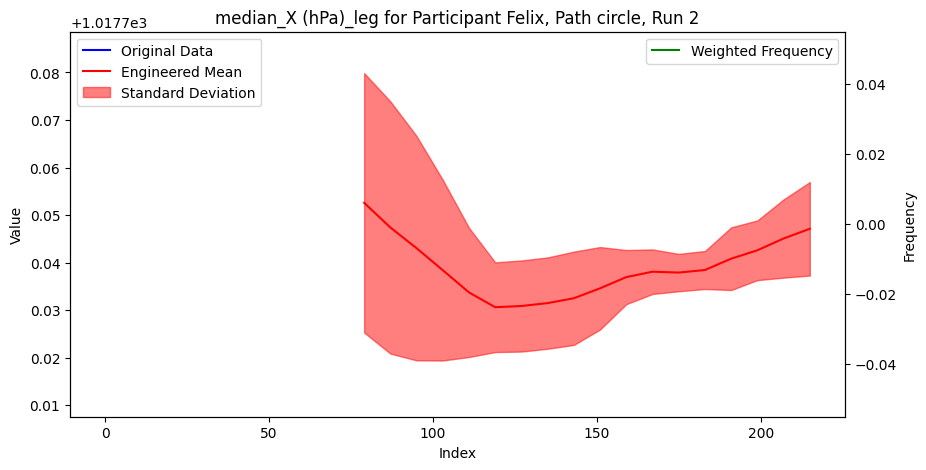

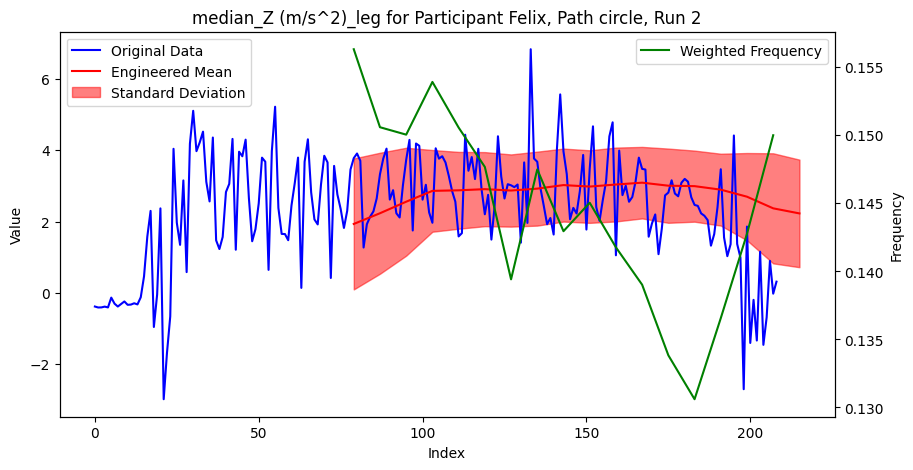

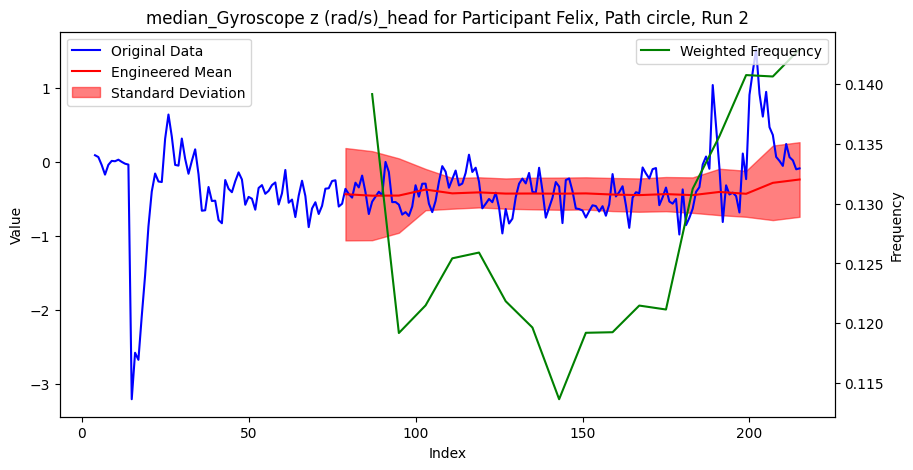

In [220]:
# compare the values of the original dataframe with the values of the engineered dataframe

# select a random participant, path and run

participants = engineered_df['Participant'].unique()

participant = np.random.choice(participants)

paths = engineered_df['Path'].unique()

path = np.random.choice(paths)

runs = engineered_df['Run'].unique()

run = np.random.choice(runs)

# select the rows of the original dataframe for the selected participant, path and run

original_rows = slimmer_df[(slimmer_df['Participant'] == participant) & (slimmer_df['Path'] == path) & (slimmer_df['Run'] == run)]

# select the rows of the engineered dataframe for the selected participant, path and run

engineered_rows = engineered_df[(engineered_df['Participant'] == participant) & (engineered_df['Path'] == path) & (engineered_df['Run'] == run)]

# plot the values of the original dataframe and the engineered dataframe

# select the columns to plot

cols = slimmer_df.columns

# exclude the End Time , path, run and participant columns

cols = [col for col in cols if col not in ['End Time', 'Path', 'Run', 'Participant']]

# sample 3 columns

sample_cols = np.random.choice(cols, 3)

# plot the values of the original dataframe and the engineered dataframe, consider that the engineered dataframe has fewer rows than the original dataframe, because it has been aggregated in windows

for col in sample_cols:
    if original_rows.empty or engineered_rows.empty:
        print(f"No data to plot for {col}")
        continue
    
    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Plot original data
    x_original = np.arange(original_rows.shape[0])
    ax1.plot(x_original, original_rows[col], label='Original Data', color='blue')

    # Adjust x for engineered data
    x_engineered = np.arange(engineered_rows.shape[0])
    x_engineered = (x_engineered * step_size) + (window_size - 1)

    ax1.plot(x_engineered, engineered_rows[f"{col}_mean"], label='Engineered Mean', color='red')

    # Plot standard deviation
    ax1.fill_between(x_engineered, engineered_rows[f"{col}_mean"] - engineered_rows[f"{col}_std"],
                     engineered_rows[f"{col}_mean"] + engineered_rows[f"{col}_std"], alpha=0.5, color='red', label='Standard Deviation')

    # Setting labels for ax1
    ax1.set_xlabel('Index')
    ax1.set_ylabel('Value')
    ax1.set_title(f'{col} for Participant {participant}, Path {path}, Run {run}')
    ax1.legend(loc='upper left')

    # Create secondary axis for dominant frequency
    ax2 = ax1.twinx()
    ax2.plot(x_engineered, engineered_rows[f"{col}_get_weighted_freq"], label='Weighted Frequency', color='green')
    ax2.set_ylabel('Frequency')
    ax2.legend(loc='upper right')

    plt.show()


In [221]:
# count the nuber of windows for each participant

print(engineered_df.groupby('Participant').size())

Participant
Dany       249
Felix      208
Julian     162
Mark       162
Martin     161
Michele    155
Paul       209
dtype: int64


In [223]:
slimmer_df

,End Time,Run,Participant,Path,median_Acceleration x (m/s^2)_head,median_Acceleration y (m/s^2)_head,median_Acceleration z (m/s^2)_head,median_Direction (°)_head,median_Direction (°)_leg,median_Gyroscope x (rad/s)_head,...,median_X (hPa)_leg,median_X (m/s^2)_leg,median_X (rad/s)_leg,median_X (µT)_leg,median_Y (m/s^2)_leg,median_Y (rad/s)_leg,median_Y (µT)_leg,median_Z (m/s^2)_leg,median_Z (rad/s)_leg,median_Z (µT)_leg
0,1970-01-01 00:01:14.236228590,3,Julian,circle,-3.471986,-0.090329,9.256635,86.514656,NaN,-0.469450,...,NaN,-0.658226,0.022438,123.455391,-4.504605,0.000273,195.901749,1.650818,0.008748,78.587250
1,1970-01-01 00:01:14.486228590,3,Julian,circle,-2.650948,-0.737588,9.439386,NaN,NaN,-0.056123,...,NaN,-0.612048,0.034109,122.905174,-4.672918,0.037783,195.822647,1.579334,-0.028206,78.441177
2,1970-01-01 00:01:14.736228590,3,Julian,circle,-2.840281,-0.060419,9.559326,NaN,NaN,0.034514,...,1017.633820,-0.986449,0.041490,122.695869,-8.812923,0.009405,195.164680,3.122507,-0.004405,77.957073
3,1970-01-01 00:01:14.986228590,3,Julian,circle,-2.528914,-0.217448,9.335598,NaN,87.232205,0.020388,...,NaN,-0.480299,-0.000894,122.772240,-4.536046,-0.012437,195.140076,1.684289,0.016194,78.156670
4,1970-01-01 00:01:15.236228590,3,Julian,circle,-2.793620,-0.347557,9.433703,86.514656,NaN,0.002902,...,NaN,-0.638595,-0.026224,123.054726,-4.538974,0.016945,195.372772,1.680194,0.011039,78.066238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14565,1970-01-01 00:04:19.202577700,3,Martin,straight,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-1.431324,-0.090929,-9.155414,-5.036574,-0.216845,43.120304,0.864906,0.038943,8.780956
14566,1970-01-01 00:04:19.452577700,3,Martin,straight,NaN,NaN,NaN,NaN,NaN,NaN,...,1017.750397,-0.758772,-0.049797,-8.435550,-0.535951,-0.102620,42.880436,0.675062,-0.009320,9.694489
14567,1970-01-01 00:04:19.702577700,3,Martin,straight,NaN,NaN,NaN,NaN,320.187022,NaN,...,NaN,-1.085543,-0.062142,-8.442186,-9.419911,-0.088548,42.923237,0.875829,-0.051616,10.078011
14568,1970-01-01 00:04:19.952577700,3,Martin,straight,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [222]:
len(slimmer_df.columns)

41

# Testing

In [79]:
test_df = {'Participant': ['Paul','Paul','Paul','Mark','Mark','Mark','John','John','John'], 'Path': ['A','A','A','A','A','A','A','A','A'], 'Run': [1,1,1,1,1,1,1,1,1], 'Feature1': [1,2,3,4,5,6,7,8,9], 'Feature2': [10,20,30,40,50,60,70,80,90]}

test_df = pd.DataFrame(test_df)

In [81]:
test_df

,Participant,Path,Run,Feature1,Feature2
0,Paul,A,1,1,10
1,Paul,A,1,2,20
2,Paul,A,1,3,30
3,Mark,A,1,4,40
4,Mark,A,1,5,50
5,Mark,A,1,6,60
6,John,A,1,7,70
7,John,A,1,8,80
8,John,A,1,9,90


In [88]:
test_df.groupby(['Participant', 'Path', 'Run']).rolling(window=3, min_periods=1).agg('mean').apply(lambda x: x.iloc[::-1])

Feature1  Feature2
Participant Path Run                      
Paul        A    1   2       2.0      20.0
                     1       1.5      15.0
                     0       1.0      10.0
Mark        A    1   5       5.0      50.0
                     4       4.5      45.0
                     3       4.0      40.0
John        A    1   8       8.0      80.0
                     7       7.5      75.0
                     6       7.0      70.0

In [ ]:
agg_df = slim_df.groupby(['Participant', 'Path', 'Run']).rolling(window=window_size, min_periods=1).mean().reset_index().dropna()